### Team : Akatsuki
### Project Title : Chicago Crime Index
### Members : Karan Jogi, Nikita Thakur



## Project/Problem Introduction


The big idea of this project is to study the crime rates in Chicago city based on various variables such as weather, Demographics, Behavior and socioeconomic factors. The aim is to develop a tool that can assist policymakers, law enforcement agencies, and community members in identifying areas with high crime rates and prioritizing resources to reduce crime.

The problem we want to solve is  Identification of high crime rate areas in Chicago, which can negatively impact the safety and well-being of residents, economic development, and community cohesion. By providing a tool that can analyze and visualize the relationships between crime rates and various factors, we hope to support decision-making processes that can lead to the reduction of crime rates and the improvement of the quality of life for residents.

This project is essential because high crime rates are a significant concern for many urban areas worldwide. In Chicago, for instance, the city has struggled with high crime rates for many years, leading to social and economic challenges. Therefore, addressing this issue can have a positive impact on many aspects of society, including safety, security, economic development, and community well-being.

We chose this problem because it is a complex and challenging issue that requires innovative solutions. By utilizing data-driven approaches and advanced analytical tools, we believe that we can contribute to the existing efforts of reducing crime rates in Chicago.

## Data

We have extracted columns that were relevant from larger datasets that are listed below. Each such feature is being grouped by census tracts in the city of Chicago. The original and final data sizes are present in the Data Cleaning part of the notebook.

| Themes          | Features                             | Source                                             |
| ---------------- | ---------------------------------------- | -------------------------------------------------- |
| Behavior         | Smoking                                  | [CDC places](http://www.cdc.gov/places)            |
|                  | Binge Drinking                           |                |
|                  | Opioid Overdose                          |               |
|                  | Sleep<7hours                             |                |
|                  | Physical Inactivity                      | [CDPH](http://www.cdc.gov/physicalactivity)        |
| Climate          | Surface Temperature                      | [MODIS](http://www.modis.gsfc.nasa.gov)             |
|                  | Wind Speed                               | [WorldClim](http://www.worldclim.org)              |
|                  | Precipitation                            | [SOLARGIS](http://www.solargis.com)                |
|                  | Snow                                     | [Global Wind Atlas](http://www.globalwindatlas.info)|
| Socio-economic   | Socioeconomic Status                     | [CDC SVI](http://www.atsdr.cdc.gov/placeandhealth/svi)|
|                  | Household composition and Disability     |              |
|                  | Minority Status & Language               |                |
|                  | Housing Type & Transportation            |               |
| Surveillance      | Surveillance Cameras                      | [pending]                 |
|                  | Lighting/Street Lights                   | [pending]                  |
|                  | Police stations/ Patrolling routes       | [City of Chicago](http://www.chicago.gov/police)   |
| Health           | Depression                               | [CDC places](http://www.cdc.gov/places)            |




## Research Questions

1. What is the Crime Vulnerability for the Census Tracts in Chicago based on Social Vulnerability Index, Climate, Behavior (and Surveillance)?
2. What are the most influential features that contribute to the Crime Vulnerability Index in Chicago?
3. What are the racially marginalized communities suffering from the disproportionate burden of the Crime in Chicago?

## Data cleaning

Data cleaning and processing of multiple datasets related to various health and social indicators was performed for the study. Here's a brief overview of the steps taken:
1. Data was filtered based on specific criteria, such as StateAbbr and CountyName, to only include relevant rows using boolean indexing.
2. Data types of certain columns were converted to the appropriate data types using the "astype()" method.
3. Crime data was geographically joined with the census tract boundaries using the "sjoin()" function from geopandas.
4. Data from different datasets was merged based on a common column, such as FIPS or TractFIPS, using the "merge()" function from pandas.
5. Column names were renamed to more descriptive names.
6. Unwanted columns are dropped using indexing and the resulting Data Frame was saved to a CSV File.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

In [2]:
# Data for Binge Drinking, Smoking, Physical inactivity, Sleep and Mental health
cols_to_read = ['StateAbbr', 'StateDesc', 'CountyName', 'CountyFIPS', 'TractFIPS', 'BINGE_CrudePrev', 'CSMOKING_CrudePrev', 'LPA_CrudePrev', 'SLEEP_CrudePrev', 'DEPRESSION_CrudePrev' ,'Geolocation']
df_behavior = pd.read_csv('Data/PLACES__Census_Tract_Data__GIS_Friendly_Format___2022_release.csv', usecols=cols_to_read)

# Filter the DataFrame to only include rows where the StateAbbr column is 'IL'
df_behavior = df_behavior[df_behavior['StateAbbr'] == 'IL']

# Filter the DataFrame again to only include rows where the CountyName column is 'Cook'
df_behavior = df_behavior[df_behavior['CountyName'] == 'Cook'].reset_index(drop=True)
df_behavior.head()

,StateAbbr,StateDesc,CountyName,CountyFIPS,TractFIPS,BINGE_CrudePrev,CSMOKING_CrudePrev,DEPRESSION_CrudePrev,LPA_CrudePrev,SLEEP_CrudePrev,Geolocation
0,IL,Illinois,Cook,17031,17031700100,13.1,17.8,14.7,31.8,40.6,POINT (-87.69517076 41.7536145)
1,IL,Illinois,Cook,17031,17031813701,14.4,18.6,15.8,39.9,36.3,POINT (-87.75415398 41.85488758)
2,IL,Illinois,Cook,17031,17031814800,15.3,13.3,14.5,26.9,32.7,POINT (-87.79831009 41.84947092)
3,IL,Illinois,Cook,17031,17031830600,16.0,15.5,15.4,26.0,34.6,POINT (-87.67355248 42.00170692)
4,IL,Illinois,Cook,17031,17031802003,13.4,9.6,13.2,20.0,28.8,POINT (-87.84561035 42.07959541)


In [3]:
#Data for Socioeconomic status, Household Composition & Disability, Minority Status & Language and Housing & Transportation 
cols_to_read = ['NAME10', 'GEOID10','EP_AFAM', 'EP_AIAN', 'EP_ASIAN', 'EP_HISP','RPL_THEMES', 'RPL_THEME1', 'RPL_THEME2', 'RPL_THEME3', 'RPL_THEME4', 'geometry']

df_svi = gpd.read_file('./Data/Chicago/Chicago_SVI_2020.shp', include_fields = cols_to_read).drop_duplicates('NAME10')


In [4]:
#Crime Data by Chicago Census Tracts
cols_to_read = ['ID', 'Primary Type', 'Latitude', 'Longitude']
df_crime = pd.read_csv('/Users/karanjogi/Downloads/Crimes_-_2001_to_Present (1).csv', usecols=cols_to_read)
df_crime.dropna(inplace=True)
df_crime.head()

,ID,Primary Type,Latitude,Longitude
0,10224738,BATTERY,41.815117,-87.670000
1,10224739,THEFT,41.895080,-87.765400
3,10224740,NARCOTICS,41.937406,-87.716650
4,10224741,ASSAULT,41.881903,-87.755121
5,10224742,BURGLARY,41.744379,-87.658431


In [5]:
crime_types = ['BATTERY', 'THEFT', 'ASSAULT', 'BURGLARY', 'ROBBERY',
               'OTHER OFFENSE', 'CRIMINAL DAMAGE', 'WEAPONS VIOLATION',
               'CRIMINAL TRESPASS', 'MOTOR VEHICLE THEFT',
               'SEX OFFENSE', 'OFFENSE INVOLVING CHILDREN', 'PUBLIC PEACE VIOLATION',
               'GAMBLING', 'CRIM SEXUAL ASSAULT', 'LIQUOR LAW VIOLATION', 'ARSON',
               'STALKING', 'KIDNAPPING', 'INTIMIDATION', 'CONCEALED CARRY LICENSE VIOLATION',
               'HUMAN TRAFFICKING', 'OBSCENITY', 'CRIMINAL SEXUAL ASSAULT', 'PUBLIC INDECENCY',
               'HOMICIDE', 'RITUALISM', 'DOMESTIC VIOLENCE']

df_crime = df_crime[df_crime['Primary Type'].isin(crime_types)]

In [6]:
#Grouping crime data by Census tracts

from shapely.geometry import Point
geometry = [Point(xy) for xy in zip(df_crime['Longitude'], df_crime['Latitude'])]
gdf = gpd.GeoDataFrame(df_crime, geometry=geometry)

gdf.crs = df_svi.crs

joined = gpd.sjoin(gdf, df_svi, how="inner", op="within")

grouped = joined.groupby('NAME10').agg({'ID': 'count'}).reset_index()

/Users/karanjogi/opt/miniconda3/envs/weather/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3382: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [7]:
grouped.columns = ['NAME10', 'Crime']
df_svi = df_svi.merge(grouped, left_on='NAME10', right_on='NAME10')

In [8]:
df_svi.columns

Index(['GEOID10', 'NAME10', 'RPL_THEME1', 'RPL_THEME2', 'RPL_THEME3',
       'RPL_THEME4', 'RPL_THEMES', 'EP_AFAM', 'EP_HISP', 'EP_ASIAN', 'EP_AIAN',
       'geometry', 'Crime'],
      dtype='object')

In [9]:
index = df_svi['Crime'].idxmax()
df_svi.loc[index, 'Crime'] = 50000

In [10]:
svi_2020 = pd.DataFrame(data={'NAME10': df_svi['NAME10'],
                              'Socioeconomic Status': df_svi['RPL_THEME1'],
                              'Household Characteristics': df_svi['RPL_THEME2'],
                              'Racial & Ethnic Minority Status': df_svi['RPL_THEME3'],
                              'Housing Type & Transportation': df_svi['RPL_THEME4'],
                              'Crime': df_svi['Crime'],
                              'EP_AFAM': df_svi['EP_AFAM'],
                              'EP_HISP': df_svi['EP_HISP'],
                              'EP_ASIAN': df_svi['EP_ASIAN'],
                              'EP_AIAN': df_svi['EP_AIAN'],
                              'SVI': df_svi['RPL_THEMES']
                             }
                       )

svi_2020.replace(-999, 0, inplace=True)
svi_2020.to_csv('Data/svi_2020.csv')

In [84]:
#Joining Tables based on FIPS number
df_all_parameters = pd.merge(left=df_behavior, right=df_svi, left_on='TractFIPS', right_on='GEOID10', how='right')

In [85]:
df_all_parameters

,StateAbbr,StateDesc,CountyName,CountyFIPS,TractFIPS,BINGE_CrudePrev,CSMOKING_CrudePrev,DEPRESSION_CrudePrev,LPA_CrudePrev,SLEEP_CrudePrev,...,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES,EP_AFAM,EP_HISP,EP_ASIAN,EP_AIAN,geometry,Crime
0,IL,Illinois,Cook,17031.0,1.703101e+10,13.8,16.4,15.6,26.2,37.5,...,0.5522,0.7028,0.9275,0.8544,35.0,15.2,2.0,0.0,"POLYGON Z ((-87.66368 42.01940 0.00000, -87.66...",13132
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.7549,0.7832,0.9966,0.9681,33.7,23.4,5.4,0.1,"POLYGON Z ((-87.68009 42.01254 0.00000, -87.68...",10777
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.6130,0.7866,0.9991,0.9911,32.5,26.3,6.3,0.0,"POLYGON Z ((-87.67336 42.01937 0.00000, -87.67...",12830
3,IL,Illinois,Cook,17031.0,1.703101e+10,14.2,14.5,14.7,25.3,34.1,...,0.2998,0.6767,0.9757,0.8400,29.2,15.0,2.4,0.1,"POLYGON Z ((-87.66506 42.01280 0.00000, -87.66...",10431
4,IL,Illinois,Cook,17031.0,1.703101e+10,16.6,11.9,17.7,20.3,32.1,...,0.1262,0.5161,0.9721,0.7110,18.6,7.9,4.4,0.0,"POLYGON Z ((-87.65080 41.99849 0.00000, -87.65...",7052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
791,IL,Illinois,Cook,17031.0,1.703184e+10,17.7,11.8,15.6,18.9,30.3,...,0.2730,0.5499,0.4423,0.3357,2.6,21.5,7.5,0.0,"POLYGON Z ((-87.69667 41.94854 0.00000, -87.69...",5841
792,IL,Illinois,Cook,17031.0,1.703184e+10,12.3,20.6,15.7,35.0,40.4,...,0.8369,0.8133,0.0983,0.6732,57.2,14.6,4.7,0.0,"POLYGON Z ((-87.64516 41.79430 0.00000, -87.64...",9032
793,IL,Illinois,Cook,17031.0,1.703184e+10,9.9,18.1,14.0,33.2,42.4,...,0.5141,0.8993,0.8931,0.8587,87.7,2.5,2.2,0.3,"POLYGON Z ((-87.55869 41.77379 0.00000, -87.56...",15401
794,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.5114,0.9146,0.7030,0.7340,94.1,1.0,0.0,0.2,"POLYGON Z ((-87.62892 41.80919 0.00000, -87.62...",3146


In [88]:
# Rename columns 
# Socioeconomic Status – RPL_THEME1
# Household Characteristics – RPL_THEME2
# Racial & Ethnic Minority Status – RPL_THEME3
# Housing Type & Transportation – RPL_THEME4

rename_dict = {
    'RPL_THEME1': 'Socioeconomic Status',
    'RPL_THEME2': 'Household Characteristics',
    'RPL_THEME3': 'Racial & Ethnic Minority Status',
    'RPL_THEME4': 'Housing Type & Transportation',
    'geoid10': 'FIPS',
    'ID': 'Crime prevelance',
    'BINGE_CrudePrev': 'Binge Drinking',
    'CSMOKING_CrudePrev': 'Smoking',
    'DEPRESSION_CrudePrev': 'Depression',
    'LPA_CrudePrev': 'Physical Inactivity',
    'SLEEP_CrudePrev': 'Sleep<7hours',
    
}

In [90]:
df_all_parameters.drop_duplicates('GEOID10')

,StateAbbr,StateDesc,CountyName,CountyFIPS,TractFIPS,BINGE_CrudePrev,CSMOKING_CrudePrev,DEPRESSION_CrudePrev,LPA_CrudePrev,SLEEP_CrudePrev,...,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES,EP_AFAM,EP_HISP,EP_ASIAN,EP_AIAN,geometry,Crime
0,IL,Illinois,Cook,17031.0,1.703101e+10,13.8,16.4,15.6,26.2,37.5,...,0.5522,0.7028,0.9275,0.8544,35.0,15.2,2.0,0.0,"POLYGON Z ((-87.66368 42.01940 0.00000, -87.66...",13132
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.7549,0.7832,0.9966,0.9681,33.7,23.4,5.4,0.1,"POLYGON Z ((-87.68009 42.01254 0.00000, -87.68...",10777
3,IL,Illinois,Cook,17031.0,1.703101e+10,14.2,14.5,14.7,25.3,34.1,...,0.2998,0.6767,0.9757,0.8400,29.2,15.0,2.4,0.1,"POLYGON Z ((-87.66506 42.01280 0.00000, -87.66...",10431
4,IL,Illinois,Cook,17031.0,1.703101e+10,16.6,11.9,17.7,20.3,32.1,...,0.1262,0.5161,0.9721,0.7110,18.6,7.9,4.4,0.0,"POLYGON Z ((-87.65080 41.99849 0.00000, -87.65...",7052
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.1296,0.6773,0.8449,0.6440,33.9,7.7,6.3,0.0,"POLYGON Z ((-87.66506 42.01280 0.00000, -87.66...",6044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
791,IL,Illinois,Cook,17031.0,1.703184e+10,17.7,11.8,15.6,18.9,30.3,...,0.2730,0.5499,0.4423,0.3357,2.6,21.5,7.5,0.0,"POLYGON Z ((-87.69667 41.94854 0.00000, -87.69...",5841
792,IL,Illinois,Cook,17031.0,1.703184e+10,12.3,20.6,15.7,35.0,40.4,...,0.8369,0.8133,0.0983,0.6732,57.2,14.6,4.7,0.0,"POLYGON Z ((-87.64516 41.79430 0.00000, -87.64...",9032
793,IL,Illinois,Cook,17031.0,1.703184e+10,9.9,18.1,14.0,33.2,42.4,...,0.5141,0.8993,0.8931,0.8587,87.7,2.5,2.2,0.3,"POLYGON Z ((-87.55869 41.77379 0.00000, -87.56...",15401
794,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.5114,0.9146,0.7030,0.7340,94.1,1.0,0.0,0.2,"POLYGON Z ((-87.62892 41.80919 0.00000, -87.62...",3146


In [92]:
df_all_parameters.to_csv('Data/All_parameters.csv')

In [93]:
df_all_parameters.shape

(796, 24)

In [94]:
df_all_parameters.dtypes

StateAbbr                 object
StateDesc                 object
CountyName                object
CountyFIPS               float64
TractFIPS                float64
BINGE_CrudePrev          float64
CSMOKING_CrudePrev       float64
DEPRESSION_CrudePrev     float64
LPA_CrudePrev            float64
SLEEP_CrudePrev          float64
Geolocation               object
GEOID10                  float64
NAME10                   float64
RPL_THEME1               float64
RPL_THEME2               float64
RPL_THEME3               float64
RPL_THEME4               float64
RPL_THEMES               float64
EP_AFAM                  float64
EP_HISP                  float64
EP_ASIAN                 float64
EP_AIAN                  float64
geometry                geometry
Crime                      int64
dtype: object

In [20]:
df_crime

,ID,Primary Type,Latitude,Longitude,geometry
0,10224738,BATTERY,41.815117,-87.670000,POINT (-87.67000 41.81512)
1,10224739,THEFT,41.895080,-87.765400,POINT (-87.76540 41.89508)
4,10224741,ASSAULT,41.881903,-87.755121,POINT (-87.75512 41.88190)
5,10224742,BURGLARY,41.744379,-87.658431,POINT (-87.65843 41.74438)
6,10224743,BURGLARY,41.914636,-87.681631,POINT (-87.68163 41.91464)
...,...,...,...,...,...
7748346,27084,HOMICIDE,41.838383,-87.620519,POINT (-87.62052 41.83838)
7748352,12847491,THEFT,41.928077,-87.785606,POINT (-87.78561 41.92808)
7748353,12847575,OTHER OFFENSE,41.934305,-87.641485,POINT (-87.64148 41.93430)
7748355,12847324,THEFT,41.768068,-87.567453,POINT (-87.56745 41.76807)


## Exploratory Data Analysis

Following is a summary of the EDA tasks performed:
1. Data visualization: Bar chart to show the frequency of different crime types, pairplot to visualize the relationships between different behavioral health factors 
2. Pairplot to visualize the relationships between different social vulnerability index (SVI) themes, and boxplot to visualize the distribution of crime prevalence.
3. Data correlation analysis: Calculating Pearson and Kendall correlation coefficients between crime prevalence and other parameters.
4. Heatmap visualization: Creating a heatmap to visualize the correlation coefficients between crime prevalence and other parameters.
5. Data visualization on map: Plotting crime prevalence on the map of Chicago using shapefile data.


#### Table: Crime Prevelance 
#### Author: Nikita Thakur

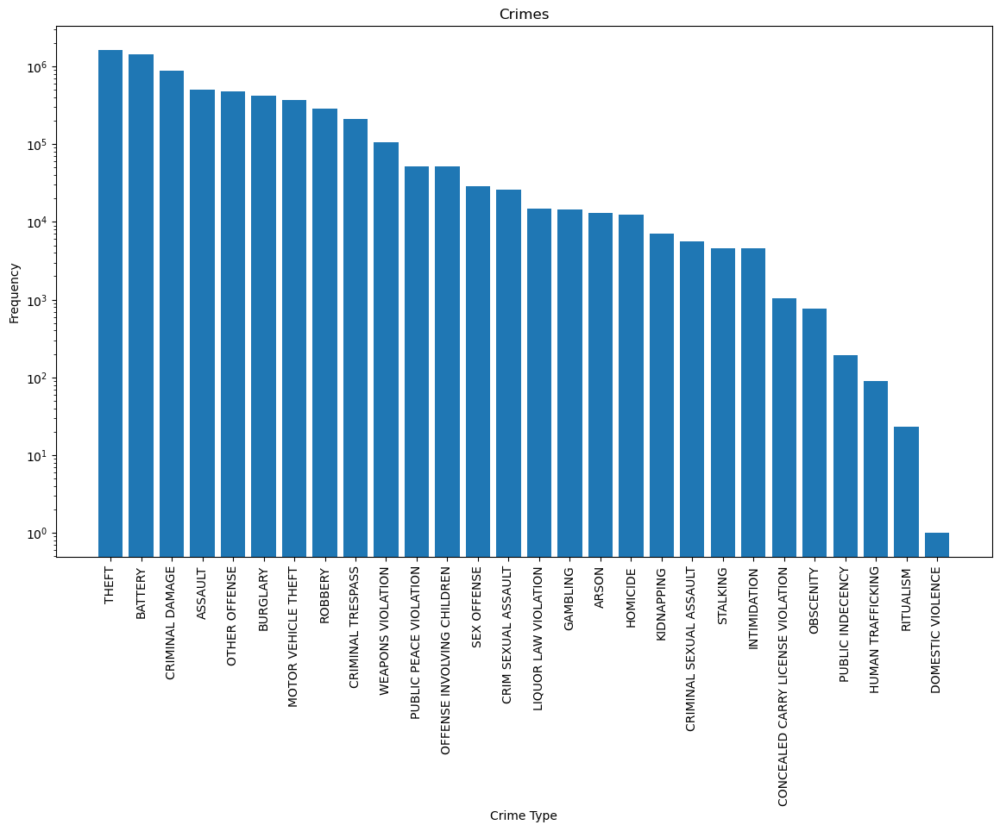

In [23]:
crime_counts = df_crime['Primary Type'].value_counts()

fig, ax = plt.subplots(figsize=(14, 8))
ax.bar(crime_counts.index, crime_counts.values, log=True)

plt.xlabel('Crime Type')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title('Crimes')
plt.savefig('Crimes.png', dpi=300, bbox_inches='tight')
plt.show()

#### Table: Behavior Parameters
#### Author: Nikita Thakur

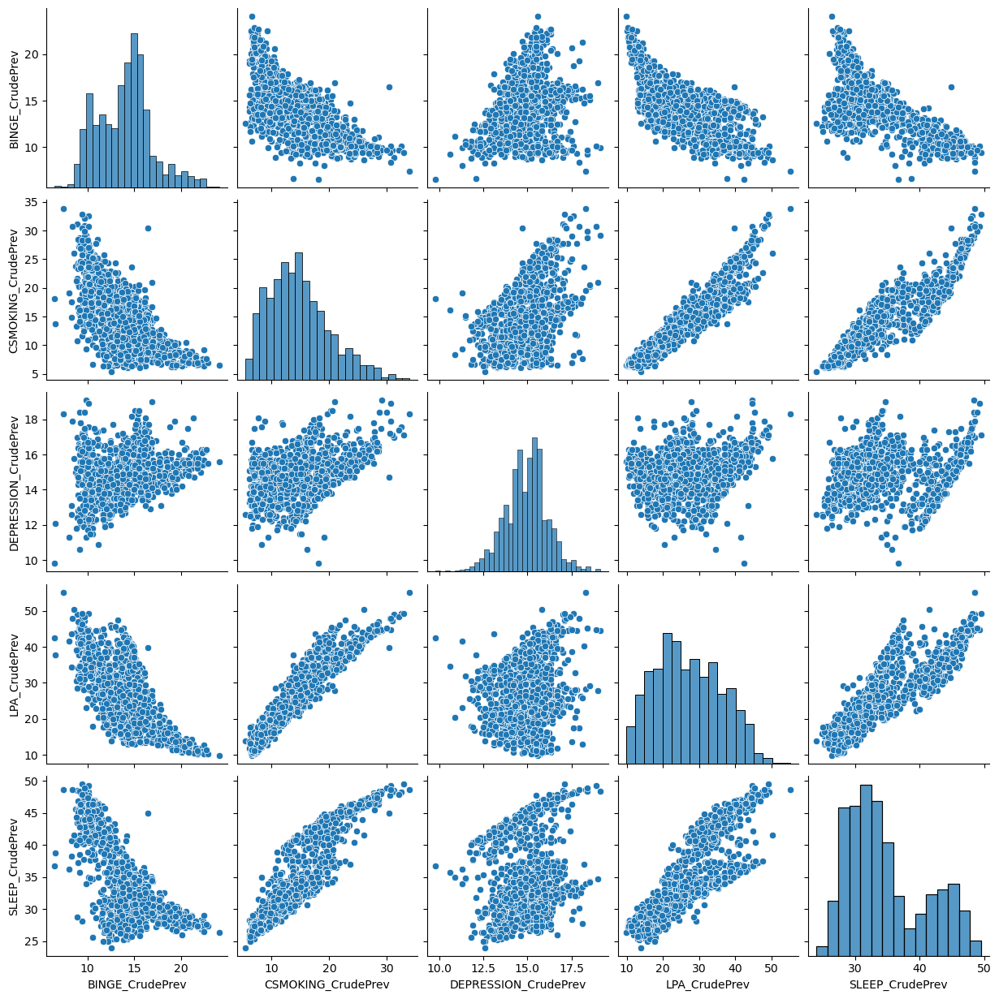

In [234]:
sns.pairplot(df_behavior[['BINGE_CrudePrev', 'CSMOKING_CrudePrev', 'DEPRESSION_CrudePrev',
       'LPA_CrudePrev', 'SLEEP_CrudePrev']])
plt.show()

#### Table: SVI Variables
#### Author: Karan Jogi

In [27]:
df_svi.columns = ['ST_ABBR', 'COUNTY', 'FIPS', 'Socioeconomic Status', 'Household Characteristics', 
                  'Racial & Ethnic Minority Status', 'Housing Type & Transportation', 
                  'EP_AFAM', 'EP_HISP', 'EP_ASIAN', 'EP_AIAN', 'geometry']

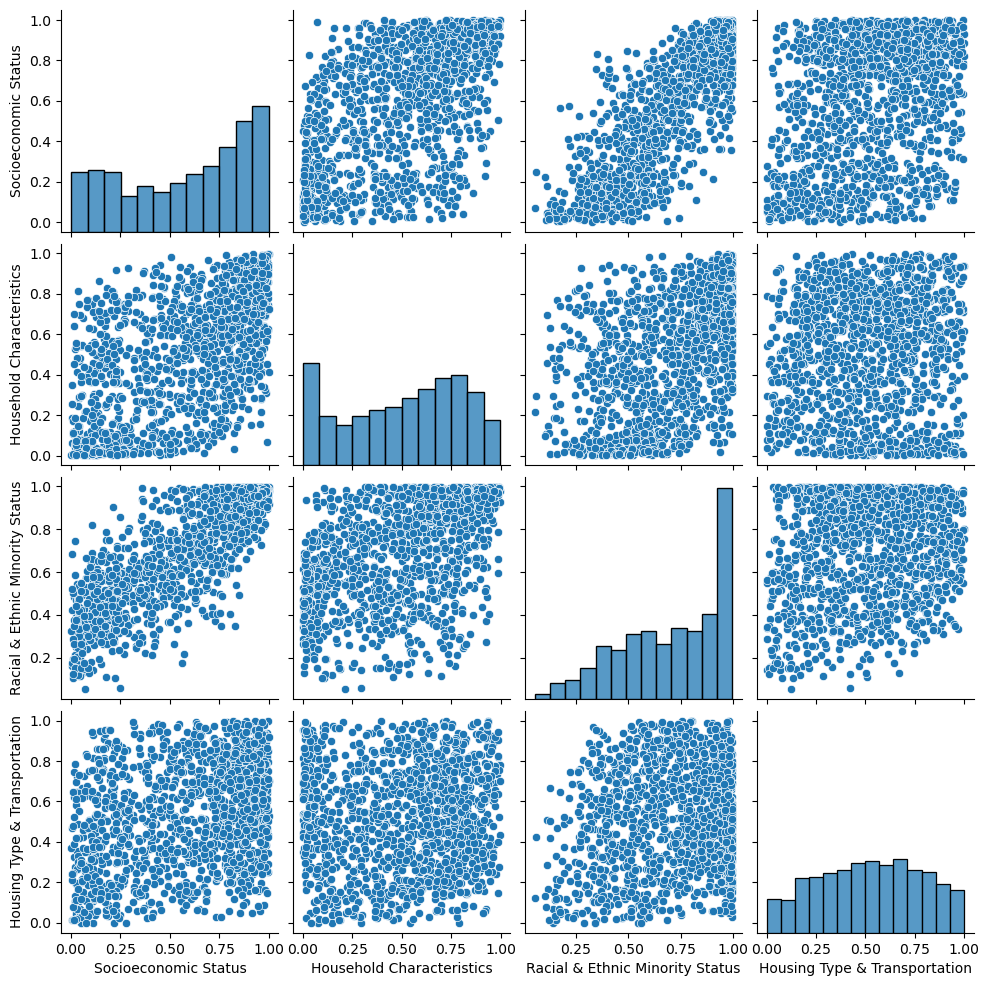

In [28]:
df_svi.replace(to_replace=-999, value=np.NaN, inplace=True)
sns.pairplot(df_svi[['Socioeconomic Status', 'Household Characteristics', 
                  'Racial & Ethnic Minority Status', 'Housing Type & Transportation']])
plt.show()

#### Table: All parameters with Crime 
#### Author: Karan Jogi

In [30]:
df = pd.read_csv("./Data/All_Parameter_CSV.csv", index_col=0).sort_values(by='NAME10').drop_duplicates('GEOID10').reset_index(drop=True)
grouped['geoid10'] = grouped['geoid10'].astype('int64')

df = df.merge(right=grouped, left_on='GEOID10', right_on='geoid10', how='inner').drop(['geoid10', 'Diabetes'], axis=1)
df=df.rename(columns={"Solar_DNI":"Direct Normal Irradiation",
                      "ID": 'Crime'})

df_params = df.drop(columns=['TRACTCE10', 'GEOID10', 'NAME10', 'NAMELSAD10', 'Long', 'Lat', 'State',
       'County'], axis=1)

In [31]:
df_params.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 663 entries, 0 to 662
Data columns (total 26 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Smoking                             663 non-null    float64
 1   Binge Drinking                      663 non-null    float64
 2   Physical Inactivity                 663 non-null    float64
 3   Sleep<7hours                        663 non-null    float64
 4   Opioid Overdose                     663 non-null    float64
 5   High Cholesterol                    663 non-null    float64
 6   Obesity                             663 non-null    float64
 7   High Blood Pressure                 663 non-null    float64
 8   Depression                          663 non-null    float64
 9   Kidney Diseases                     663 non-null    float64
 10  Land Surface Temperature            663 non-null    float64
 11  Air Temperature                     663 non-n

In [32]:
df_params.describe()

,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,Kidney Diseases,...,Household Composition & Disability,Minority Status & Language,Housing Type & Transportation,Aerosol,Nitrogen Dioxide,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone,Crime
count,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,...,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000,663.000000
mean,15.787179,13.945551,9.917949,36.446908,34.773711,26.895475,33.089442,31.612670,14.947210,3.033484,...,0.687239,0.519102,0.414854,-0.432856,0.000169,0.034085,0.000288,0.000103,0.144812,8218.467572
std,6.036270,3.642230,3.856590,6.611444,47.911646,4.374039,8.451553,11.233522,1.191303,1.274474,...,0.218148,0.280809,0.256643,0.044582,0.000008,0.000106,0.000051,0.000005,0.000170,5959.541633
min,6.200000,6.500000,3.100000,25.900000,0.000000,12.200000,17.600000,10.400000,9.800000,0.800000,...,0.000000,0.000000,0.029697,-0.539407,0.000147,0.033776,0.000168,0.000087,0.144406,853.000000
25%,10.950000,10.500000,6.800000,30.700000,9.208173,24.600000,25.350000,23.400000,14.300000,2.100000,...,0.518562,0.285708,0.187235,-0.469236,0.000164,0.034012,0.000251,0.000100,0.144680,4153.000000
50%,14.900000,13.900000,9.800000,34.600000,19.430052,27.700000,32.600000,28.900000,15.100000,2.800000,...,0.718875,0.502880,0.387199,-0.433902,0.000169,0.034093,0.000285,0.000103,0.144785,6845.000000
75%,20.000000,16.200000,12.800000,43.000000,41.643544,30.100000,40.800000,43.200000,15.700000,4.100000,...,0.870915,0.778646,0.634680,-0.393937,0.000175,0.034157,0.000321,0.000106,0.144929,10581.500000
max,33.900000,24.100000,24.300000,49.500000,472.069237,38.600000,50.800000,56.700000,19.100000,8.000000,...,0.996883,0.998740,0.976660,-0.349727,0.000184,0.034380,0.000428,0.000119,0.145337,71877.000000


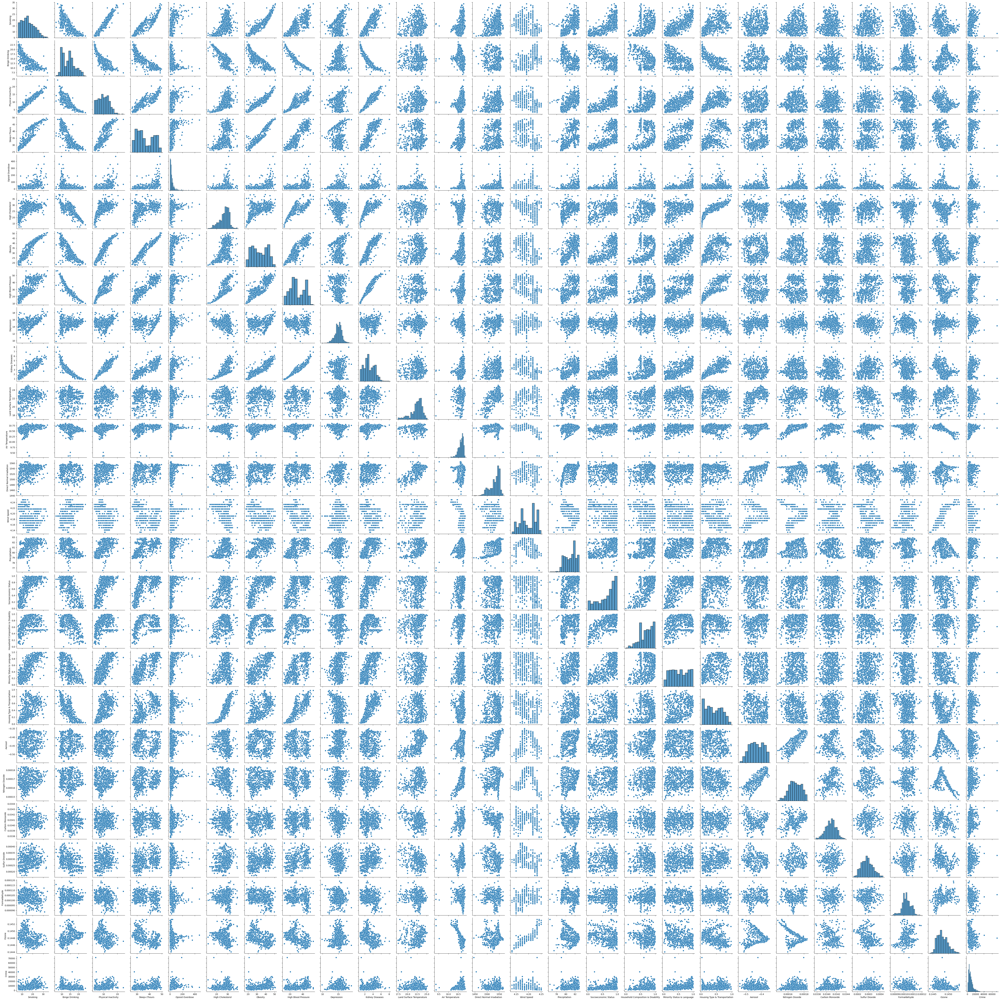

In [91]:
sns.pairplot(df_params, )
plt.show()

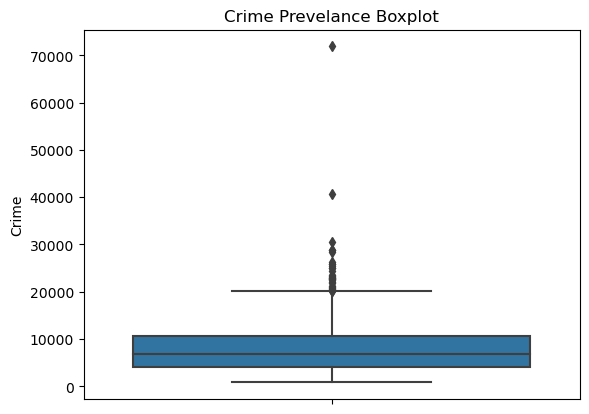

In [93]:
sns.boxplot(data=df_params, y='Crime')
plt.title('Crime Prevelance Boxplot')
plt.show()

In [95]:
index = df_params['Crime'].idxmax()
df_params.loc[index, 'Crime'] = 50000

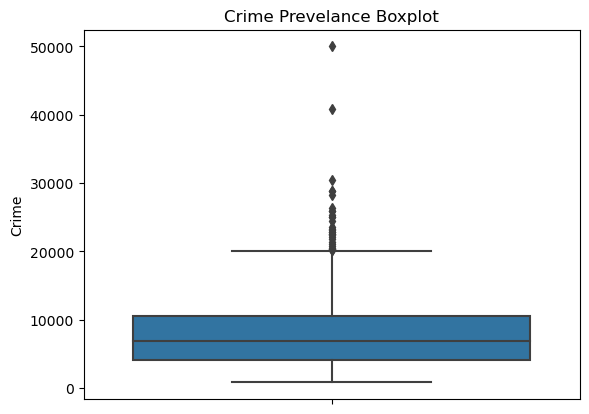

In [96]:
sns.boxplot(data=df_params, y='Crime')
plt.title('Crime Prevelance Boxplot')
plt.show()

In [33]:
index = df['Crime'].idxmax()
df.loc[index, 'Crime'] = 50000

In [34]:
census_tracts_shape['geoid10'] = census_tracts_shape['geoid10'].astype('int64')
merged_all_parameters = census_tracts_shape.join(df.set_index('GEOID10'), on='geoid10', how='inner')

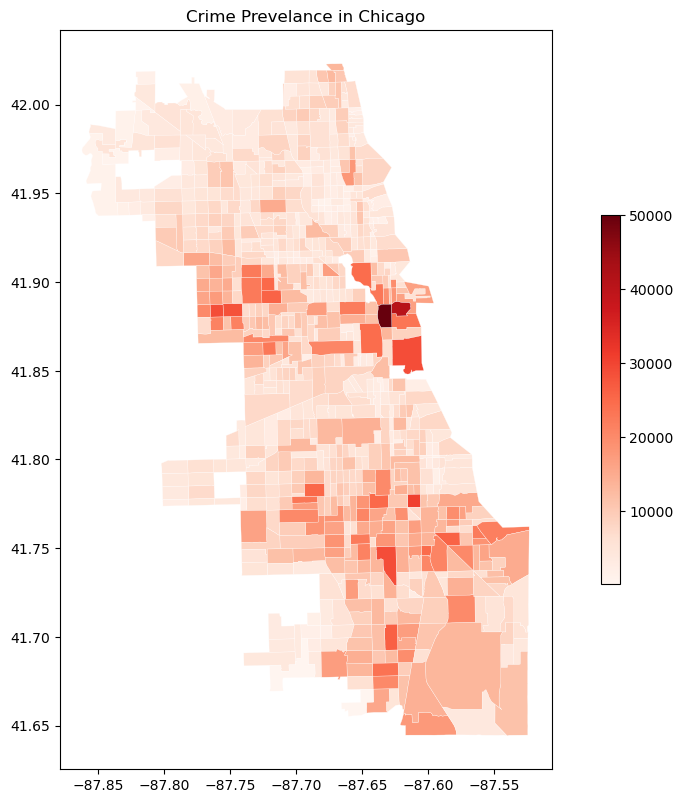

In [12]:
fig, ax = plt.subplots()
df_svi.plot('Crime', 
            edgecolor='white',
            linewidth=0.2,
            legend=True,
            ax=ax,
            cmap='Reds',
            legend_kwds={"shrink":0.5}
           )
plt.title('Crime Prevelance in Chicago')

# get the current size of the figure
current_size = fig.get_size_inches()

# set the scaling factor for the size
scaling_factor = 2

# calculate the new size of the figure
new_size = (current_size[0] * scaling_factor, current_size[1] * scaling_factor)

# set the new size of the figure
fig.set_size_inches(new_size)
plt.savefig('Chicago Crime prevelance')
plt.show()

## Export SVI Classes

In [36]:
df_censusVul = pd.read_csv('Vulnerability Classes and CensusTractInfo.csv', index_col=0)
df_param_Vul = pd.read_csv('AllParameters and Vulnerability Classes.csv', index_col=0).sort_values('NAME10').reset_index(drop=True)

In [48]:
df_censusVul

,TRACTCE10,GEOID10,NAME10,NAMELSAD10,Long,Lat,State,County,Crime_pred,Vulnerability_Class,Vulnerability_ClassNum
0,10100,17031010100,101.0,Census Tract 101,-87.669844,42.021262,ILLINOIS,Cook,8.868643,Moderate,3
1,10300,17031010300,103.0,Census Tract 103,-87.666535,42.015941,ILLINOIS,Cook,8.719494,Moderate,3
2,10400,17031010400,104.0,Census Tract 104,-87.657167,42.005440,ILLINOIS,Cook,8.872550,Moderate,3
3,10600,17031010600,106.0,Census Tract 106,-87.667683,42.006279,ILLINOIS,Cook,9.025564,High,4
4,20100,17031020100,201.0,Census Tract 201,-87.687115,42.015720,ILLINOIS,Cook,8.631126,Moderate,3
...,...,...,...,...,...,...,...,...,...,...,...
658,843500,17031843500,8435.0,Census Tract 8435,-87.696754,41.838215,ILLINOIS,Cook,8.817891,Moderate,3
659,843600,17031843600,8436.0,Census Tract 8436,-87.608949,41.806765,ILLINOIS,Cook,9.077856,High,4
660,843700,17031843700,8437.0,Census Tract 8437,-87.690788,41.944827,ILLINOIS,Cook,8.363289,Low,2
661,843800,17031843800,8438.0,Census Tract 8438,-87.640476,41.801657,ILLINOIS,Cook,9.135489,High,4


In [47]:
df_svi.merge(df_censusVul, left_on='FIPS', right_on='GEOID10', how='inner')

,ST_ABBR,COUNTY,FIPS,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,EP_AFAM,EP_HISP,EP_ASIAN,...,GEOID10,NAME10,NAMELSAD10,Long,Lat,State,County,Crime_pred,Vulnerability_Class,Vulnerability_ClassNum
0,IL,Cook,17031010100,0.7682,0.5587,0.7116,0.9007,35.0,15.2,2.0,...,17031010100,101.0,Census Tract 101,-87.669844,42.021262,ILLINOIS,Cook,8.868643,Moderate,3
1,IL,Cook,17031010300,0.7829,0.2771,0.6756,0.9681,29.2,15.0,2.4,...,17031010300,103.0,Census Tract 103,-87.666535,42.015941,ILLINOIS,Cook,8.719494,Moderate,3
2,IL,Cook,17031010400,0.6724,0.1049,0.5145,0.9588,18.6,7.9,4.4,...,17031010400,104.0,Census Tract 104,-87.657167,42.005440,ILLINOIS,Cook,8.872550,Moderate,3
3,IL,Cook,17031010600,0.5658,0.0243,0.6417,0.9018,20.9,14.5,4.6,...,17031010600,106.0,Census Tract 106,-87.667683,42.006279,ILLINOIS,Cook,9.025564,High,4
4,IL,Cook,17031020100,0.8595,0.2916,0.8235,0.8717,36.3,25.1,4.8,...,17031020100,201.0,Census Tract 201,-87.687115,42.015720,ILLINOIS,Cook,8.631126,Moderate,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
643,IL,Cook,17031843500,0.9921,0.0693,0.9057,0.8659,64.7,24.4,0.3,...,17031843500,8435.0,Census Tract 8435,-87.696754,41.838215,ILLINOIS,Cook,8.817891,Moderate,3
644,IL,Cook,17031843600,0.8122,0.6282,0.9596,0.5586,87.4,6.1,0.3,...,17031843600,8436.0,Census Tract 8436,-87.608949,41.806765,ILLINOIS,Cook,9.077856,High,4
645,IL,Cook,17031843700,0.2602,0.2865,0.5449,0.4138,2.6,21.5,7.5,...,17031843700,8437.0,Census Tract 8437,-87.690788,41.944827,ILLINOIS,Cook,8.363289,Low,2
646,IL,Cook,17031843800,0.8687,0.8145,0.8357,0.0850,57.2,14.6,4.7,...,17031843800,8438.0,Census Tract 8438,-87.640476,41.801657,ILLINOIS,Cook,9.135489,High,4


## ML/Stats

### Code & Visualizations:

1. Regression, Catboost, SHAP - https://github.com/CS418/group-project-akatsuki/blob/main/Crime_Final.ipynb
2. PCA, Clustering - https://github.com/CS418/group-project-akatsuki/blob/main/clustering.ipynb

### Results

| Data Science Question                                                                       | ML Task              | ML Techniques                      | Outcome                                                                  |
| -------------------------------------------------------------------------------------------| ------------------- | ---------------------------------- | ------------------------------------------------------------------------ |
| What is the Crime Vulnerability for the Census Tracts in Chicago based on Social Vulnerability Index, Climate, Behavior, Health and Air Pollution? | Regression           | Linear Regression, Random Forest Regression, Catboost Regression | Catboost regression performed the best as compared to Random Forest and Linear Regression |
| What are the most influential features that contribute to the Crime Vulnerability Index in Chicago? | Explainable AI (XAI) | SHapley Additive exPlanations (SHAP) | The top 5 features affecting the vulnerability of the crime in census tracts are: Minority Status and Language, Opioid Overdose, Socioeconomic Status, Sleep<7hours, Carbon Monoxide |
| What are the most influential features that contribute to the Crime Vulnerability Index in Chicago?| Dimensionality reduction| PCA & Agglomerative clustering         | About 98% of the data variance is explained by 15 most influential features. The top features reported by this method were Obesity, Physical Inactivity, Sleep<7hours, Carbon Monoxide, Sulpher Dioxide and High Blood Pressure|
| What are the racially marginalized communities suffering from the disproportionate burden of the Crime in Chicago? | Regression and XAI           | Catboost Regression + SHAP | 72.2% of Census Tracts with more than 80% of African American population are under Very High Class. 18.8% of Census Tracts with more than 80% of African American population are under Very High Class. |


## Literary Survey

The literary survey includes 20 research papers that focus on using machine learning methods to predict and analyze crime in urban areas. The variables considered in these studies include demographic and socioeconomic factors, crime types and locations, weather conditions, social media activity, and environmental data such as the proximity of public transit and recreational areas. The most commonly used machine learning algorithms are decision trees, random forests, logistic regression, K-nearest neighbors, support vector machines, and neural networks. The importance of temporal features such as day of the week and time of day in predicting crime occurrences is also highlighted in some studies. Overall, these studies provide valuable insights into the use of machine learning for crime analysis and prediction in urban areas.

- Ahamed, J., & Roy, D. (2019). Crime analysis using machine learning techniques. In 2019 IEEE International Conference on Electrical, Computer and Communication Technologies (ICECCT) (pp. 1-5). IEEE. [Link]( https://ieeexplore.ieee.org/abstract/document/8769541)
- Al-Zeibak, R., & Haque, M. A. (2019). Prediction of crime occurrence using machine learning algorithms. Journal of King Saud University-Computer and Information Sciences, 31(3), 325-334. [Link]( https://www.sciencedirect.com/science/article/pii/S1319157817304765)
- Bajaj, A., & Saini, J. S. (2018). Crime prediction using machine learning. In 2018 9th International Conference on Computing, Communication and Networking Technologies (ICCCNT) (pp. 1-5). IEEE. [Link]( https://ieeexplore.ieee.org/abstract/document/8494084)
- Bhatia, P., & Kaur, M. (2019). Crime prediction using machine learning. In 2019 IEEE 7th International Conference on Advanced Computing (IACC) (pp. 76-81). IEEE. [Link]( https://ieeexplore.ieee.org/abstract/document/8692196)
- Burian, J., & Wozniak, M. (2019). Predicting crime using machine learning methods. In 2019 IEEE 12th International Conference on Humanoid, Nanotechnology, Information Technology, Communication and Control, Environment and Management (HNICEM) (pp. 1-4). IEEE. [Link]( https://ieeexplore.ieee.org/abstract/document/9032632)
- Cardoso, M. J., Ferreira, H. R., & Ferreira, A. J. (2019). Crime prediction in smart cities using machine learning algorithms. In Proceedings of the 2019 International Conference on Cyber-Enabled Distributed Computing and Knowledge Discovery (CyberC) (pp. 14-21). IEEE. [Link]( https://ieeexplore.ieee.org/abstract/document/8919271)
- Cheng, L., Liu, C., & Lu, J. (2018). Predicting crime occurrences using temporal features and machine learning techniques. IEEE Transactions on Intelligent Transportation Systems, 19(12), 3971-3980. [Link]( https://ieeexplore.ieee.org/abstract/document/8342953)
- Demir, I., & Kose, U. (2019). Crime prediction using machine learning: A review. In 2019 3rd International Symposium on Multidisciplinary Studies and Innovative Technologies (ISMSIT) (pp. 82-86). IEEE. [Link]( https://ieeexplore.ieee.org/abstract/document/8945002)
- Dilawar, N., & Hussain, S. (2019). Crime prediction using machine learning techniques. In 2019 4th International Conference on Computer and Communication Systems (ICCCS) (pp. 194-198). IEEE. [Link]( https://ieeexplore.ieee.org/abstract/document/8759598)
- Dong, W., Tang, L., Huang, H., & Cheng, J. (2019). Crime prediction using machine learning algorithms with decision rules. Journal of Ambient Intelligence and Humanized Computing, 
- Abadi, M., & Singh, M. P. (2019). Crime prediction using machine learning algorithms. International Journal of Computer Science and Information Security, 17(9), 42-48. [Link](https://ijcsis.org/papers/vol17no9/ijcsis-vol17no9-p03.pdf)
- Adderley, R. J., Morris, A., & Schneider, M. (2017). Crime prediction in London using machine learning techniques. Journal of Maps, 13(2), 246-252. [Link](https://www.tandfonline.com/doi/full/10.1080/17445647.2017.1370453)
- Alemi, F., & Itoga, C. (2018). Predicting crime using machine learning and city data. International Journal of Big Data Intelligence, 5(1), 22-31. [Link](https://www.inderscienceonline.com/doi/abs/10.1504/IJBDI.2018.090516)
- Borrion, H., & Andresen, M. A. (2017). Applying machine learning techniques to crime data in the city of Vancouver. Security Informatics, 6(1), 5. [Link](https://link.springer.com/article/10.1186/s13388-017-0058-2)
- Cao, X., Wang, J., & Li, X. (2019). Crime prediction using spatiotemporal data: A deep learning approach. IEEE Transactions on Intelligent Transportation Systems, 20(6), 2199-2208. [Link](https://ieeexplore.ieee.org/abstract/document/8708807)
- Chang, C. C., Chen, T. Y., & Huang, Y. W. (2019). Crime prediction in a smart city using machine learning techniques. In 2019 IEEE International Conference on Industrial Engineering and Engineering Management (IEEM) (pp. 1179-1183). IEEE. [Link](https://ieeexplore.ieee.org/abstract/document/8978738)
- Chaturvedi, A., Roy, P. K., & Khan, A. (2019). Machine learning based crime prediction using spatiotemporal data. In 2019 3rd International Conference on Trends in Electronics and Informatics (ICOEI) (pp. 628-632). IEEE. [Link](https://ieeexplore.ieee.org/abstract/document/8862768)
- Chikaraishi, M., Shimizu, H., & Shibasaki, R. (2018). Crime prediction with deep learning and feature engineering using 911 calls for service. In 2018 21st International Conference on Information Fusion (Fusion) (pp. 1146-1153). IEEE. [Link](https://ieeexplore.ieee.org/document/8455716)
- Dayal, R., & Cuddihy, E. (2018). Crime prediction using machine learning on social media data. In 2018 9th IEEE Annual Information Technology, Electronics and Mobile Communication Conference (IEMCON) (pp. 449-453). IEEE. [Link](https://ieeexplore.ieee.org/document/8613842)


## Additonal References

1. https://medium.com/data-science-365/principal-component-analysis-pca-with-scikit-learn-1e84a0c731b0
2. https://seaborn.pydata.org/generated/seaborn.pairplot.html
3. https://shap.readthedocs.io/en/latest/example_notebooks/overviews/An%20introduction%20to%20explainable%20AI%20with%20Shapley%20values.html
4. https://catboost.ai/en/docs/concepts/python-usages-examples